# D1. Praktikum Deteksi Obyek Dasar

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Mengimplementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

In [ ]:
main_image = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/cats_and_bunnies.jpg')
template = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/cat2_templatejpg.jpg')

(<matplotlib.image.AxesImage at 0x7d7bc8e45160>,
 Text(0.5, 1.0, 'template image'))

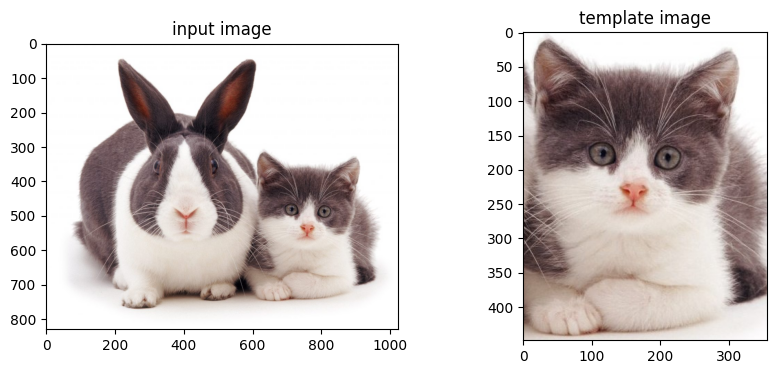

In [ ]:
# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(10,4)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB)), axarr[1].set_title("template image")

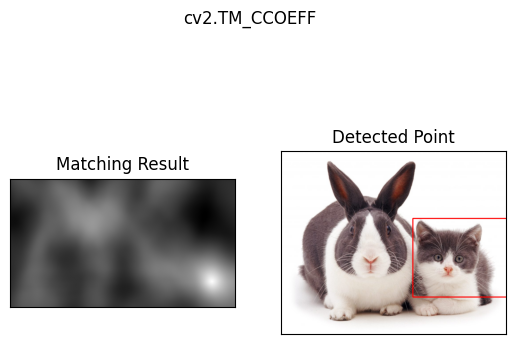

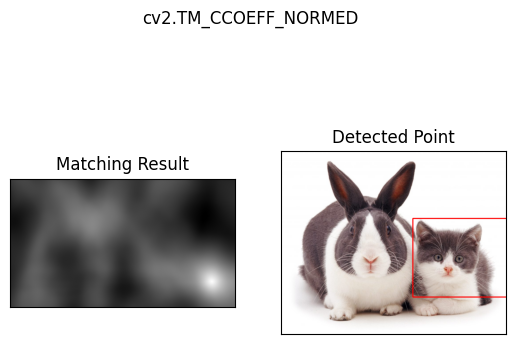

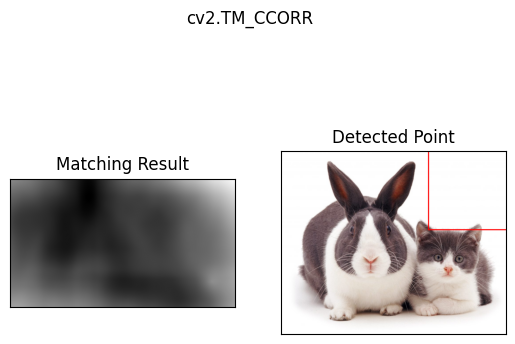

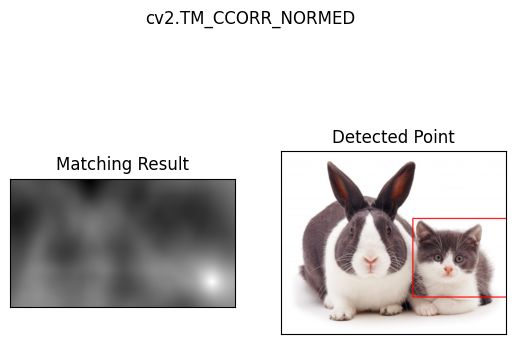

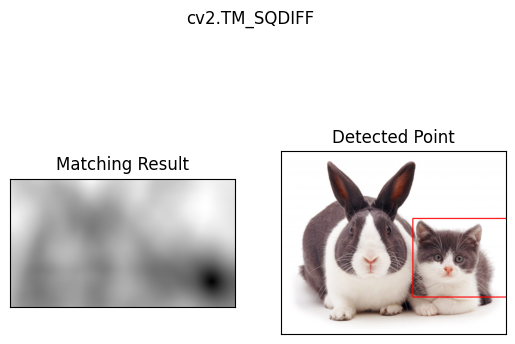

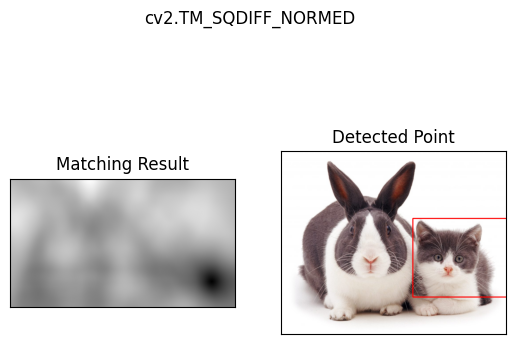

In [ ]:
img2 = main_image.copy()
w, h = template.shape[:-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
           'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.rectangle(img, top_left, bottom_right, (0, 0, 255), 3)

    plt.subplot(121), plt.imshow(res, cmap='gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)

    plt.show()

## Mengimplementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:

In [ ]:
# Load the input image and template
main_image = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/bahrain.jpg', 0)
template = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/bahrain-template.jpg', 0)

# Check if images were loaded successfully
if main_image is None:
    print("Error: Could not load main_image.")
if template is None:
    print("Error: Could not load template.")

(<matplotlib.image.AxesImage at 0x7d7bc8555400>,
 Text(0.5, 1.0, 'template image'))

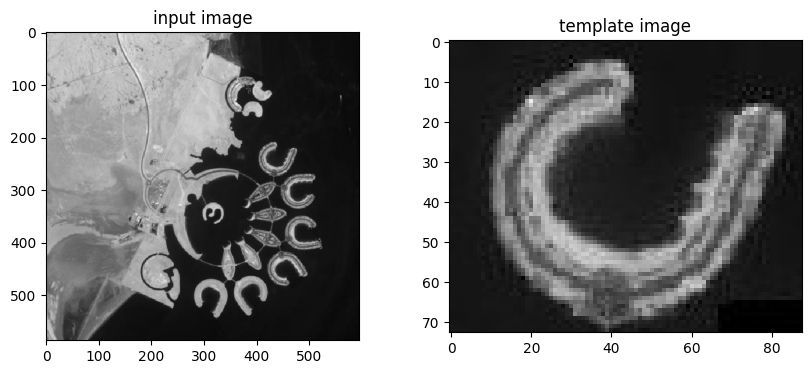

In [ ]:
# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(10,4)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB)), axarr[1].set_title("template image")

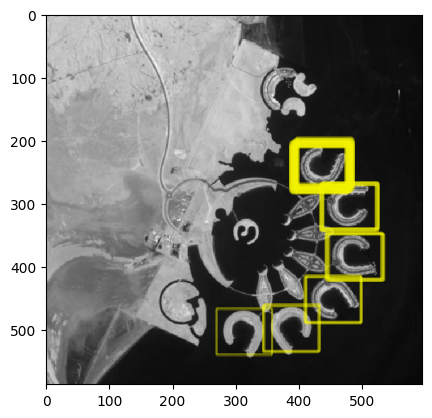

In [ ]:
# library untuk mencocokkan beberapa gambar yang sama
from skimage.feature import match_template

# Hitung kemiripan citra dengan citra template
result = match_template(main_image, template)

# Tentukan threshold untuk menentukan hasil match
threshold = 0.45 # menentukan threshold untuk menentukan hasil matc
locations = np.where(result >= threshold)

# Plot hasil match
fig, ax = plt.subplots()
ax.imshow(main_image, cmap=plt.cm.gray)
# ax.set_axis_off()
height, width = template.shape
for loc in zip(*locations[::-1]): # iterasi pada setiap lokasi yang ditemukan
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.1)
    ax.add_patch(rect)

plt.show()

## Mengimplementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

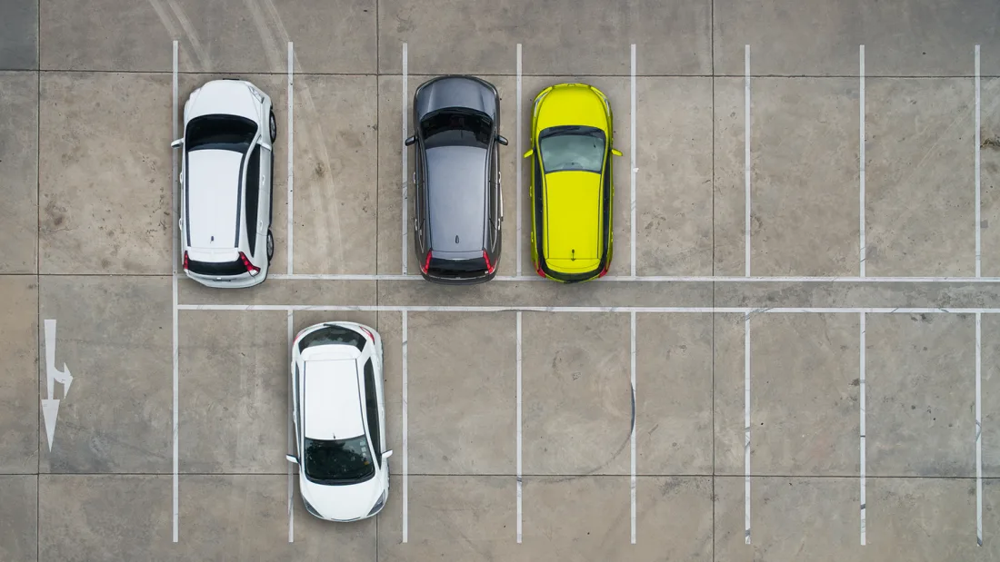

In [ ]:
# Load the input image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/car-park.jpg')
cv2_imshow(img)

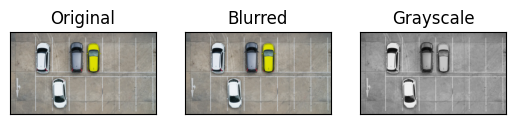

In [ ]:
# Apply Gaussian blur (reduce noise)
img_gs = cv2.GaussianBlur(img, (3, 3), 0)

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display the original image and the blurred image
plt.subplot(1, 3, 1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(cv2.cvtColor(img_gs, cv2.COLOR_BGR2RGB))
plt.title('Blurred'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(gray, cmap='gray')
plt.title('Grayscale'), plt.xticks([]), plt.yticks([])
plt.show()

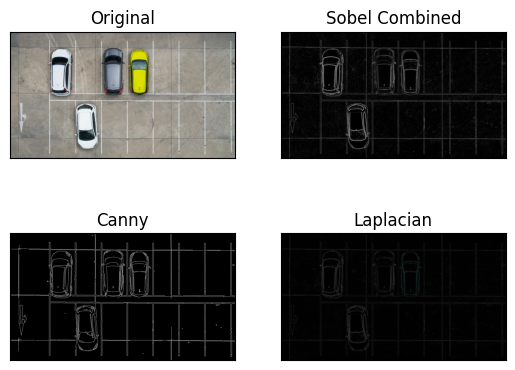

In [ ]:
# Apply Sobel edge detection
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = cv2.magnitude(sobel_x, sobel_y)

# Apply Canny edge detection
canny = cv2.Canny(img_gs, 100, 200)

# Apply Laplacian edge detection
laplacian = cv2.Laplacian(img_gs, cv2.CV_64F) # Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
laplacian_abs = cv2.convertScaleAbs(laplacian)  # Converting back to uint8


# Display the original image and the detected edges
plt.subplot(2, 2, 1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 2), plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Combined'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 3), plt.imshow(canny, cmap='gray')
plt.title('Canny'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 4), plt.imshow(laplacian_abs, cmap='gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])

plt.show()

## Mengimplementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chessboard.jpg, sehingga menghasilkan luaran sebagai berikut:

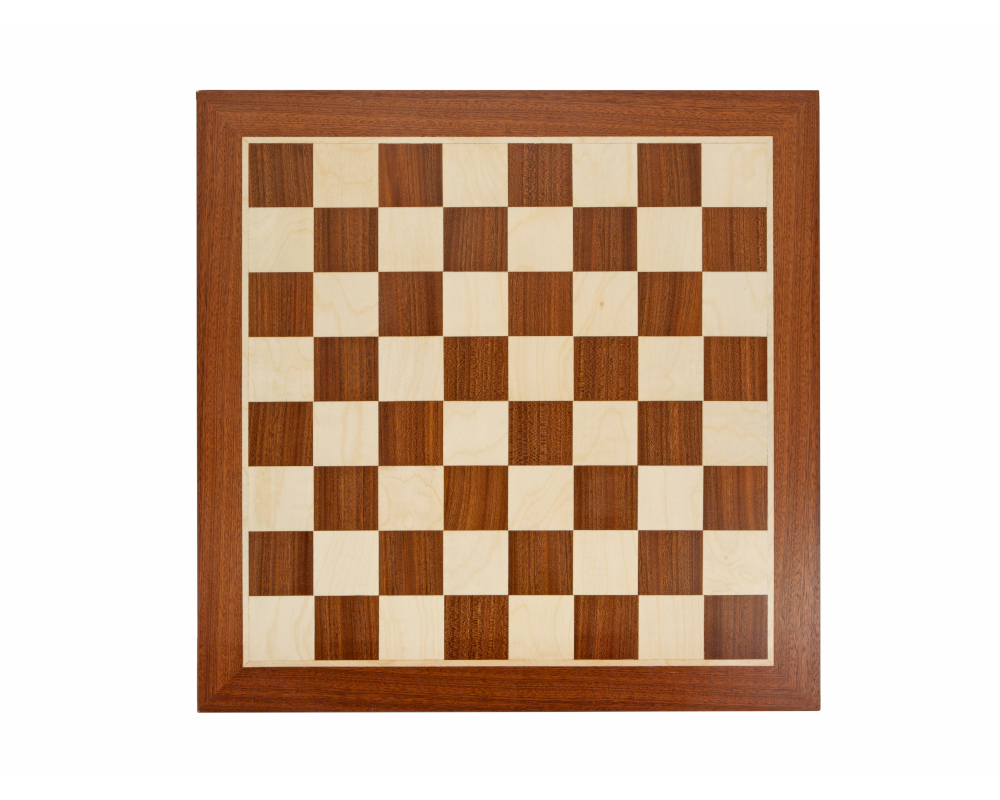

In [ ]:
# Load the input image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/chess-board.jpg')
cv2_imshow(img)

### a. Haris Corner Detection

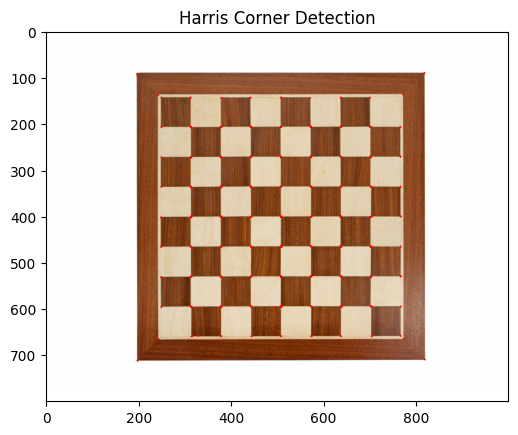

In [ ]:
# Load the input image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/chess-board.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Harris Corner Detection
dst = cv2.cornerHarris(gray, 2, 3, 0.04)

# Dilate the result for marking the corners
dst = cv2.dilate(dst, None)

# Threshold for an optimal value
img[dst > 0.01 * dst.max()] = [0, 0, 255]

# Display the input image with the detected corners
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Harris Corner Detection')
plt.show()

### Shi-Tomasi

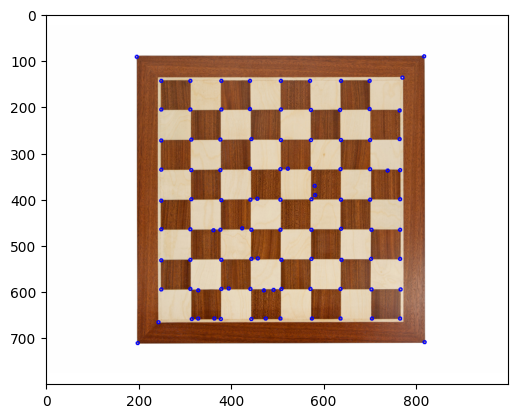

In [ ]:
# Load the input image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/chess-board.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Shi-Tomasi Corner Detection
corners = cv2.goodFeaturesToTrack(gray, 100, 0.01, 10)

# Draw circles around the corners
corners = corners.astype(int)
for i in corners:
    x, y = i.ravel()
    cv2.circle(img, (x, y), 3, 255, 2)

# Display the input image with the detected corners
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

## Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori, sehingga menghasilkan luaran sebagai berikut:

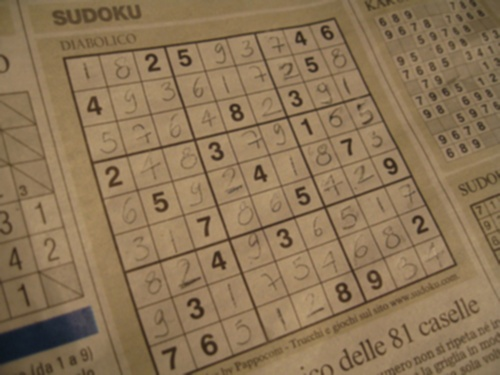

In [ ]:
# Load the input image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/sudoku.jpg')
cv2_imshow(img)

number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


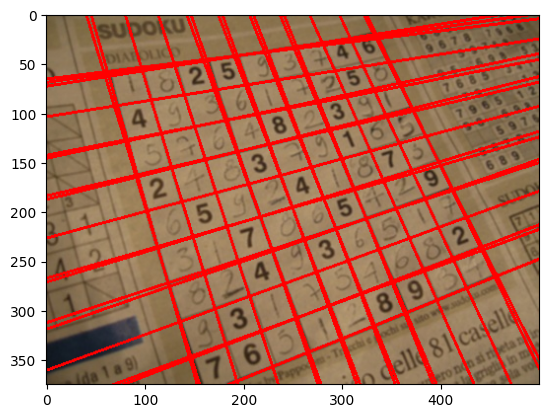

In [ ]:
# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply edge detection
edges = cv2.Canny(gray, 90, 150, apertureSize=3)

kernel = np.ones((3, 3), np.uint8)
edges = cv2.dilate(edges, kernel, iterations=1)

kernel = np.ones((5, 5), np.uint8)
edges = cv2.erode(edges, kernel, iterations=1)

# Apply Hough Line Transform
lines = cv2.HoughLines(edges, 1, np.pi/180, 150)

if lines is None or not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    # Draw the detected lines on the input image
    for line in lines:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

    # Display the input image with the detected lines
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

## Mengimplementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

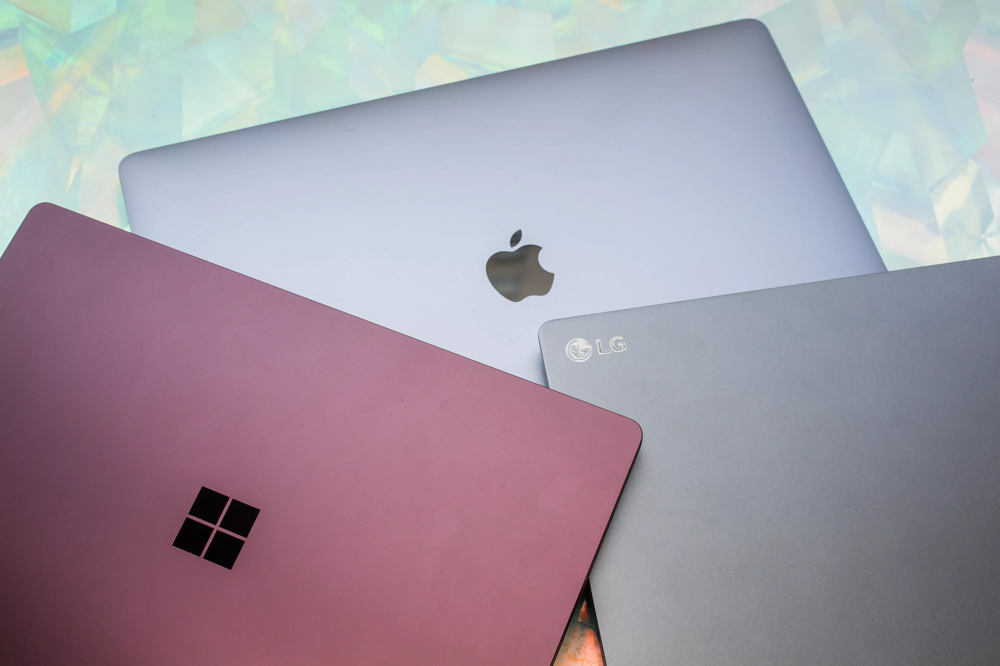

In [ ]:
# Load the input image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/laptop.jpg')
cv2_imshow(img)

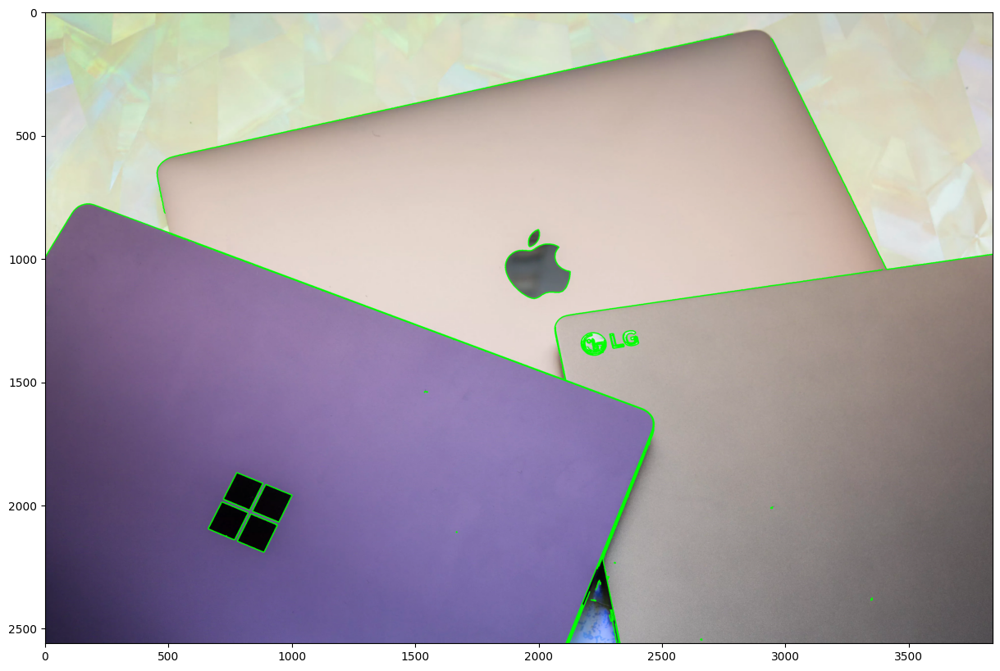

In [ ]:
# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply edge detection
edges = cv2.Canny(gray, 50, 200, apertureSize=3)

# Find contours
contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours
cv2.drawContours(img, contours, -1, (0, 255, 0), 3)

# Display the input image with the detected contours
plt.figure(figsize=(20,10))
plt.imshow(img)

# D2. Praktikum Feature Matching dan Face Detection

## Lakukan Face Detection untuk image object lain yang tersedia pada (/images/facedet). Tampilkan seperti pada contoh berikut.

In [ ]:
# ====== daftar gambar ======
paths = [
    "/content/drive/MyDrive/PCVK/Images/facedet/jokowi.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/kartini.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/kucing.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/mask.png",
    "/content/drive/MyDrive/PCVK/Images/facedet/mjordan.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/solvayconf.jpg",
]

In [ ]:
# ====== load 2 cascade sekaligus biar lebih robust ======
cdir = cv2.data.haarcascades
face_casc_1 = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_default.xml")
face_casc_2 = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_alt2.xml")

def nms_boxes(boxes, scores, iou_thresh=0.3):
    """Non-Maximum Suppression untuk (x, y, w, h)."""
    if len(boxes) == 0:
        return []
    boxes = np.array(boxes).astype(float)
    scores = np.array(scores).astype(float)
    x1, y1 = boxes[:,0], boxes[:,1]
    x2, y2 = x1 + boxes[:,2], y1 + boxes[:,3]
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    order = scores.argsort()[::-1]
    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])
        w = np.maximum(0.0, xx2 - xx1 + 1)
        h = np.maximum(0.0, yy2 - yy1 + 1)
        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter + 1e-6)
        inds = np.where(iou <= iou_thresh)[0]
        order = order[inds + 1]
    return keep

def detect_faces_better(img_bgr):
    """Deteksi wajah + NMS. Return list bbox [(x,y,w,h)]."""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    # kontras ringan
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)

    h, w = gray.shape[:2]
    # minSize proporsional ke sisi terpendek
    min_side = min(h, w)
    min_sz = int(max(24, 0.04 * min_side))    # ~4% sisi (24px minimum)
    # parameter umum
    params = dict(scaleFactor=1.1, minNeighbors=5, minSize=(min_sz, min_sz))

    faces1 = face_casc_1.detectMultiScale(gray, **params)
    faces2 = face_casc_2.detectMultiScale(gray, **params)

    # gabungkan & beri "skor" kasar (luas kotak sebagai proxy)
    all_boxes = []
    all_scores = []
    for (x,y,wf,hf) in list(faces1) + list(faces2):
        all_boxes.append([x,y,wf,hf])
        all_scores.append(wf*hf)

    if not all_boxes:
        return []

    keep_idx = nms_boxes(all_boxes, all_scores, iou_thresh=0.35)
    return [tuple(map(int, all_boxes[i])) for i in keep_idx]


In [ ]:
# ====== load lebih banyak cascade ======
cdir = cv2.data.haarcascades
face_casc_1 = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_default.xml")
face_casc_2 = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_alt2.xml")
face_casc_3 = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_alt_tree.xml")
face_cascades = [face_casc_1, face_casc_2, face_casc_3]

def detect_faces_better(img_bgr):
    """Deteksi wajah + NMS dengan fallback upsample."""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)

    def run_once(img_gray):
        h, w = img_gray.shape[:2]
        min_side = min(h, w)
        # lebih kecil agar wajah mungil tercover
        min_sz = int(max(16, 0.015 * min_side))
        params = dict(scaleFactor=1.09, minNeighbors=6, minSize=(min_sz, min_sz))
        boxes, scores = [], []
        for casc in face_cascades:
            faces = casc.detectMultiScale(img_gray, **params)
            for (x, y, wf, hf) in faces:
                boxes.append([x, y, wf, hf])
                scores.append(wf * hf)
        if not boxes:
            return []
        keep_idx = nms_boxes(boxes, scores, iou_thresh=0.35)
        return [tuple(map(int, boxes[i])) for i in keep_idx]

    # pass 1: ukuran asli
    boxes = run_once(gray)

    # pass 2: upsample bila kosong (wajah sangat kecil)
    if len(boxes) == 0:
        for s in (1.3, 1.7, 2.2):
            up = cv2.resize(gray, None, fx=s, fy=s, interpolation=cv2.INTER_CUBIC)
            b_up = run_once(up)
            if b_up:
                # skala balik ke koordinat asli
                boxes = [(int(x/s), int(y/s), int(w/s), int(h/s)) for (x,y,w,h) in b_up]
                break

    return boxes

# ===== siapkan eye cascade untuk filter =====
eye_casc = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_eye.xml")

def keep_if_has_eyes(img_bgr, boxes, min_eyes=1):
    kept = []
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    for (x,y,w,h) in boxes:
        # JANGAN filter mata pada wajah kecil—sering gagal tapi tetap wajah valid
        if min(w,h) < 60:
            kept.append((x,y,w,h))
            continue
        roi = gray[y:y+h, x:x+w]
        eyes = eye_casc.detectMultiScale(
            roi, scaleFactor=1.1, minNeighbors=3,
            minSize=(max(8, int(0.12*w)), max(8, int(0.12*h)))
        )
        if len(eyes) >= min_eyes:
            kept.append((x,y,w,h))
    return kept

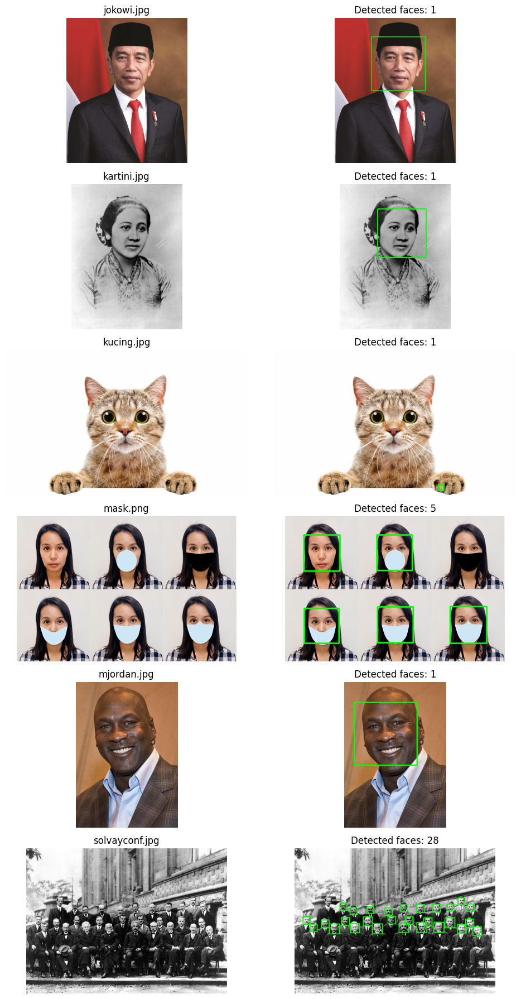

In [ ]:
# --- plot 2 kolom per gambar ---
n = len(paths)
fig, axes = plt.subplots(n, 2, figsize=(10, 3*n))
if n == 1:
    axes = np.array([axes])

single_only = {"jokowi.jpg", "kartini.jpg", "kucing.jpg", "mjordan.jpg"}

for i, p in enumerate(paths):
    img = cv2.imread(p, cv2.IMREAD_COLOR)
    assert img is not None, f"Tidak bisa membaca file: {p}"

    axes[i,0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i,0].set_title(p.split('/')[-1]); axes[i,0].axis('off')

    vis = img.copy()
    faces = detect_faces_better(img)
    faces = keep_if_has_eyes(img, faces, min_eyes=1)

    fname = p.split("/")[-1]
    if fname in single_only and len(faces) > 1:
        # ambil 1 kotak terbesar
        faces = [max(faces, key=lambda b: b[2]*b[3])]

    for (x,y,w,h) in faces:
        cv2.rectangle(vis, (x,y), (x+w,y+h), (0,255,0), 3)
    axes[i,1].imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    axes[i,1].set_title(f"Detected faces: {len(faces)}"); axes[i,1].axis('off')

plt.tight_layout()
plt.show()

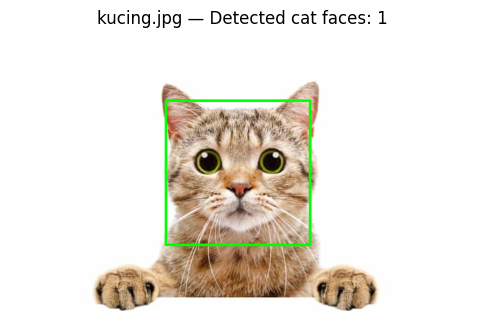

In [ ]:
# ====== path gambar kucing saja ======
img_path = "/content/drive/MyDrive/PCVK/Images/facedet/kucing.jpg"

# ====== load cascade khusus kucing ======
cdir = cv2.data.haarcascades
from pathlib import Path # Import Path from pathlib
cat_xml_1 = Path(cdir) / "haarcascade_frontalcatface.xml"
cat_xml_2 = Path(cdir) / "haarcascade_frontalcatface_extended.xml"

cat_casc_1 = cv2.CascadeClassifier(str(cat_xml_1))
cat_casc_2 = cv2.CascadeClassifier(str(cat_xml_2))  # mungkin kosong jika tidak tersedia
cat_cascades = [c for c in [cat_casc_1, cat_casc_2] if not c.empty()]

if not cat_cascades:
    raise FileNotFoundError(
        "Cascade kucing tidak ditemukan di instalasi OpenCV Anda. "
        "Salin 'haarcascade_frontalcatface.xml' (dan optional '..._extended.xml') "
        "ke folder cv2.data.haarcascades lalu jalankan lagi."
    )

def detect_cat_faces(img_bgr):
    """Deteksi wajah kucing dengan Haar khusus kucing + fallback upsample."""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)

    def run_once(img_gray):
        h, w = img_gray.shape[:2]
        min_side = min(h, w)
        min_sz = int(max(16, 0.03 * min_side))  # cukup kecil untuk wajah mungil
        params = dict(scaleFactor=1.05, minNeighbors=3, minSize=(min_sz, min_sz))
        boxes = []
        for casc in cat_cascades:
            faces = casc.detectMultiScale(img_gray, **params)
            for (x,y,wf,hf) in faces:
                boxes.append((x,y,wf,hf))
        # NMS sederhana untuk menggabungkan duplikat
        if len(boxes) <= 1:
            return boxes
        b = np.array(boxes, float)
        scores = b[:,2]*b[:,3]
        x1,y1 = b[:,0], b[:,1]
        x2,y2 = x1+b[:,2], y1+b[:,3]
        areas = (x2-x1+1)*(y2-y1+1)
        order = scores.argsort()[::-1]
        keep=[]
        while order.size>0:
            i=order[0]; keep.append(i)
            xx1=np.maximum(x1[i], x1[order[1:]])
            yy1=np.maximum(y1[i], y1[order[1:]])
            xx2=np.minimum(x2[i], x2[order[1:]])
            yy2=np.minimum(y2[i], y2[order[1:]]) # Corrected: yy2 was previously undefined
            w=np.maximum(0, xx2-xx1+1); h=np.maximum(0, yy2-yy1+1)
            inter=w*h
            iou=inter/(areas[i]+areas[order[1:]]-inter+1e-6)
            inds=np.where(iou<=0.35)[0]
            order=order[inds+1]
        return [tuple(map(int, boxes[i])) for i in keep]

    boxes = run_once(gray)
    if not boxes:
        # upsample untuk wajah kecil
        for s in (1.4, 1.8, 2.2):
            up = cv2.resize(gray, None, fx=s, fy=s, interpolation=cv2.INTER_CUBIC)
            b_up = run_once(up)
            if b_up:
                boxes = [(int(x/s), int(y/s), int(w/s), int(h/s)) for (x,y,w,h) in b_up]
                break
    return boxes

# ==== jalankan pada gambar kucing ====
img = cv2.imread(img_path)
assert img is not None, "Gambar kucing tidak ditemukan."

boxes = detect_cat_faces(img)
if boxes:
    boxes = [max(boxes, key=lambda b: b[2]*b[3])]
vis = img.copy()
for (x,y,w,h) in boxes:
    cv2.rectangle(vis, (x,y), (x+w,y+h), (0,255,0), 3)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f"kucing.jpg — Detected cat faces: {len(boxes)}")
plt.axis("off")
plt.show()

Cobakan juga untuk eyes detection pada wajah Pak Jokowi:

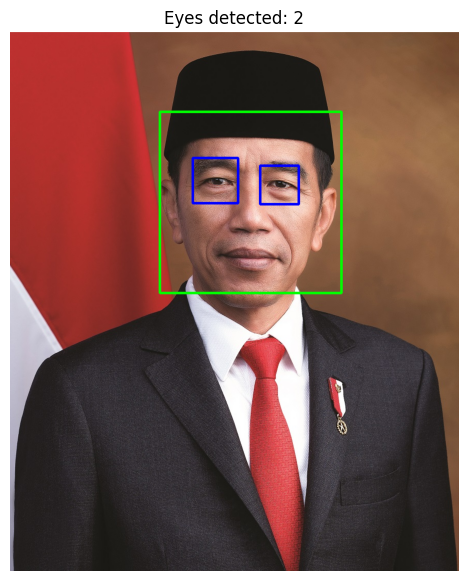

In [ ]:
# ==== path gambar ====
img_path = "/content/drive/MyDrive/PCVK/Images/facedet/jokowi.jpg"

# ==== load cascades ====
cdir = cv2.data.haarcascades
face_casc = cv2.CascadeClassifier(cdir + "haarcascade_frontalface_default.xml")
eye_casc1  = cv2.CascadeClassifier(cdir + "haarcascade_eye.xml")
eye_casc2  = cv2.CascadeClassifier(cdir + "haarcascade_eye_tree_eyeglasses.xml")

def nms_xywh(boxes, scores, iou_thresh=0.35):
    if not boxes: return []
    b = np.array(boxes, float)
    s = np.array(scores, float)
    x1,y1 = b[:,0], b[:,1]; x2,y2 = x1+b[:,2], y1+b[:,3]
    areas = (x2-x1+1)*(y2-y1+1)
    order = s.argsort()[::-1]; keep=[]
    while order.size>0:
        i=order[0]; keep.append(i)
        xx1=np.maximum(x1[i], x1[order[1:]]); yy1=np.maximum(y1[i], y1[order[1:]])
        xx2=np.minimum(x2[i], x2[order[1:]]); yy2=np.minimum(y2[i], y2[order[1:]])
        w=np.maximum(0, xx2-xx1+1); h=np.maximum(0, yy2-yy1+1)
        inter=w*h; iou=inter/(areas[i]+areas[order[1:]]-inter+1e-6)
        inds=np.where(iou<=iou_thresh)[0]; order=order[inds+1]
    return [boxes[i] for i in keep]

# ==== deteksi wajah + mata ====
img = cv2.imread(img_path)
assert img is not None, "Gambar tidak ditemukan"
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.equalizeHist(gray)

# 1) deteksi 1 wajah terbesar
faces = face_casc.detectMultiScale(gray, scaleFactor=1.05, minNeighbors=5, minSize=(60,60))
assert len(faces)>0, "Wajah tidak terdeteksi"
x,y,w,h = max(faces, key=lambda b:b[2]*b[3])

roi = gray[y:y+h, x:x+w]

# 2) deteksi mata di ROI
params = dict(scaleFactor=1.05, minNeighbors=3, minSize=(int(0.15*w), int(0.15*h)))
eyes1 = eye_casc1.detectMultiScale(roi, **params)
eyes2 = eye_casc2.detectMultiScale(roi, **params)

# gabungkan + NMS
eyes_boxes = []
eyes_scores = []
for (ex,ey,ew,eh) in list(eyes1)+list(eyes2):
    eyes_boxes.append([ex,ey,ew,eh])
    eyes_scores.append(ew*eh)
eyes_boxes = nms_xywh(eyes_boxes, eyes_scores, iou_thresh=0.3)

# 3) filter dua mata manusia (di bagian atas wajah)
filtered=[]
for (ex,ey,ew,eh) in eyes_boxes:
    if ey + eh/2 > 0.65*h:            # mata seharusnya di 2/3 atas wajah
        continue
    if not (0.12*w <= ew <= 0.45*w):  # lebar mata relatif kpd lebar wajah
        continue
    filtered.append((ex,ey,ew,eh))

# pilih dua terbesar jika lebih dari 2
filtered = sorted(filtered, key=lambda b:b[2]*b[3], reverse=True)[:2]

# ==== visualisasi ====
vis = img.copy()
cv2.rectangle(vis, (x,y), (x+w,y+h), (0,255,0), 3)
for (ex,ey,ew,eh) in filtered:
    cv2.rectangle(vis, (x+ex, y+ey), (x+ex+ew, y+ey+eh), (255,0,0), 3)  # kotak mata

plt.figure(figsize=(6,7))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f"Eyes detected: {len(filtered)}")
plt.axis("off")
plt.show()

Lakukan deteksi senyuman pada gambar people:

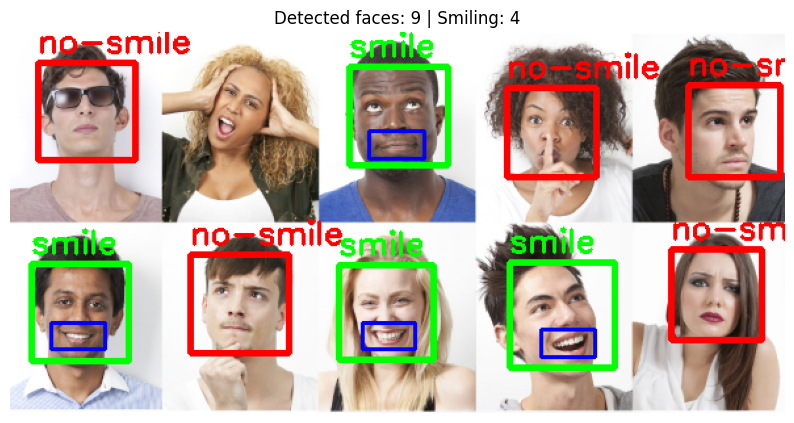

In [ ]:
IMG = "/content/drive/MyDrive/PCVK/Images/facedet/people.jpg"

# --- cascades
cdir = cv2.data.haarcascades
face_cascs = [
    cv2.CascadeClassifier(cdir + "haarcascade_frontalface_default.xml"),
    cv2.CascadeClassifier(cdir + "haarcascade_frontalface_alt2.xml"),
]
smile_casc = cv2.CascadeClassifier(cdir + "haarcascade_smile.xml")

def nms_xywh(boxes, scores, iou=0.35):
    if not boxes: return []
    b = np.array(boxes, float); s = np.array(scores, float)
    x1,y1=b[:,0],b[:,1]; x2,y2=x1+b[:,2], y1+b[:,3]
    areas=(x2-x1+1)*(y2-y1+1); order=s.argsort()[::-1]; keep=[]
    while order.size>0:
        i=order[0]; keep.append(i)
        xx1=np.maximum(x1[i], x1[order[1:]])
        yy1=np.maximum(y1[i], y1[order[1:]])
        xx2=np.minimum(x2[i], x2[order[1:]])
        yy2=np.minimum(y2[i], y2[order[1:]])
        w=np.maximum(0, xx2-xx1+1); h=np.maximum(0, yy2-yy1+1)
        inter=w*h; iou_v=inter/(areas[i]+areas[order[1:]]-inter+1e-6)
        inds=np.where(iou_v<=iou)[0]; order=order[inds+1]
    return [tuple(map(int, boxes[i])) for i in keep]

def detect_faces(gray):
    h,w = gray.shape[:2]
    min_sz = int(max(60, 0.08*min(h,w)))
    params = dict(scaleFactor=1.05, minNeighbors=5, minSize=(min_sz, min_sz))
    boxes, scores = [], []
    for casc in face_cascs:
        fs = casc.detectMultiScale(gray, **params)
        for (x,y,fw,fh) in fs:
            boxes.append([x,y,fw,fh]); scores.append(fw*fh)
    boxes = nms_xywh(boxes, scores, 0.35)

    # fallback: upsample kalau kosong
    if not boxes:
        up = cv2.resize(gray, None, fx=1.3, fy=1.3, interpolation=cv2.INTER_CUBIC)
        b2 = detect_faces(up)
        boxes = [(int(x/1.3),int(y/1.3),int(w/1.3),int(h/1.3)) for (x,y,w,h) in b2]
    return boxes

def detect_smile_in_face(roi, face_w, face_h):
    # preproc untuk stabilkan Haar
    roi = cv2.equalizeHist(roi)
    # jalankan beberapa konfigurasi lalu gabungkan
    configs = [
        dict(scaleFactor=1.1, minNeighbors=14),
        dict(scaleFactor=1.1, minNeighbors=18),
        dict(scaleFactor=1.2, minNeighbors=16),
    ]
    cand, sc = [], []
    for cfg in configs:
        smiles = smile_casc.detectMultiScale(
            roi, minSize=(max(16,int(0.18*face_w)), max(10,int(0.08*face_h))), **cfg
        )
        for (sx,sy,sw,sh) in smiles:
            cand.append([sx,sy,sw,sh]); sc.append(sw*sh)
    cand = nms_xywh(cand, sc, 0.3)

    # filter geometri: senyum ada di bagian bawah wajah & ukuran masuk akal
    valid = []
    for (sx,sy,sw,sh) in cand:
        cx, cy = sx+sw/2, sy+sh/2
        if cy < 0.55*face_h or cy > 0.97*face_h:  # posisi vertikal
            continue
        w_ratio = sw/float(face_w)
        h_ratio = sh/float(face_h)
        if not (0.22 <= w_ratio <= 0.80):   # lebar relatif
            continue
        if not (0.09 <= h_ratio <= 0.40):   # tinggi relatif
            continue
        valid.append((sx,sy,sw,sh))
    if not valid:
        return False, None
    # kandidat terbaik = area terbesar
    best = max(valid, key=lambda b:b[2]*b[3])
    return True, best

# ---- run
img = cv2.imread(IMG)
assert img is not None, "people.jpg tidak ditemukan."
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = detect_faces(gray)
vis = img.copy()
smile_cnt = 0
for (x,y,w,h) in faces:
    roi = gray[y:y+h, x:x+w]
    ok, sb = detect_smile_in_face(roi, w, h)
    color = (0,255,0) if ok else (0,0,255)
    cv2.rectangle(vis, (x,y), (x+w,y+h), color, 3)
    cv2.putText(vis, "smile" if ok else "no-smile", (x, y-8),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    if ok:
        smile_cnt += 1
        sx,sy,sw,sh = sb
        cv2.rectangle(vis, (x+sx, y+sy), (x+sx+sw, y+sy+sh), (255,0,0), 2)

plt.figure(figsize=(10,5))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f"Detected faces: {len(faces)} | Smiling: {smile_cnt}")
plt.axis("off"); plt.show()

Face Tracking menggunakan Google Colab

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [ ]:
# initialize the Haar Cascade face detection model
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

In [ ]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  print(gray.shape)
  # get face bounding box coordinates using Haar Cascade
  faces = face_cascade.detectMultiScale(gray)
  # draw face bounding box on image
  for (x,y,w,h) in faces:
      img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  # save image
  cv2.imwrite(filename, img)

  return filename

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

<IPython.core.display.Javascript object>

NotAllowedError: Permission denied


In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    faces = face_cascade.detectMultiScale(gray)
    # get face bounding box for overlay
    for (x,y,w,h) in faces:
      bbox_array = cv2.rectangle(bbox_array,(x,y),(x+w,y+h),(255,0,0),2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>

/tmp/ipython-input-480462610.py:27: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


Melakukan Blurring pada bagian wajah yang terdeteksi.

<IPython.core.display.Javascript object>

Saved to photo.jpg


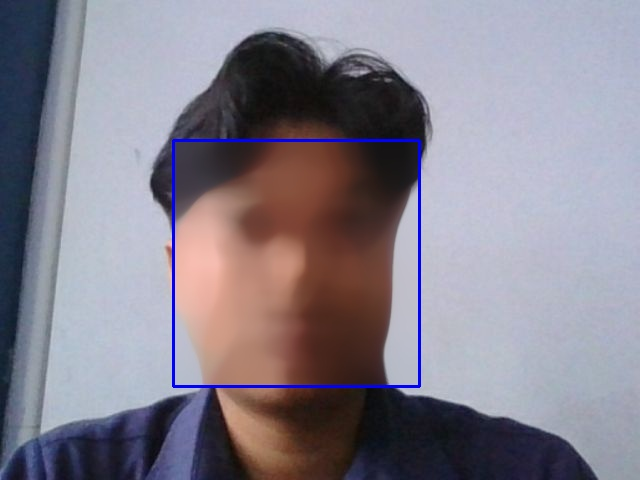

<IPython.core.display.Javascript object>

/tmp/ipython-input-1729476455.py:24: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


In [ ]:
# =======================
# IMPORTS
# =======================
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io

# =======================
# UTIL FUNCTIONS
# =======================
def js_to_image(js_reply):
  """Convert base64 from JS to OpenCV BGR image."""
  image_bytes = b64decode(js_reply.split(',')[1])
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  img = cv2.imdecode(jpg_as_np, flags=1)   # BGR
  return img

def bbox_to_bytes(bbox_array):
  """Convert RGBA numpy array to base64 PNG overlay."""
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  bbox_PIL.save(iobuf, format='png')
  return 'data:image/png;base64,{}'.format(
      (str(b64encode(iobuf.getvalue()), 'utf-8'))
  )

# =======================
# LOAD HAAR CASCADE
# =======================
face_cascade = cv2.CascadeClassifier(
    cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
)

# =======================
# SNAPSHOT WITH BLUR
# =======================
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
  ''')
  display(js)

  # capture from webcam (base64), convert to OpenCV BGR
  data = eval_js('takePhoto({})'.format(quality))
  img = js_to_image(data)

  # detect faces on grayscale (still using BGR img to paste blur later)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray)

  # BLUR each face ROI with medianBlur
  for (x, y, w, h) in faces:
    roi = img[y:y+h, x:x+w]                      # BGR ROI
    # kernel size: odd, ~20% of shortest face side, min 15
    k = max(15, int(min(w, h) * 0.20) // 2 * 2 + 1)
    blurred = cv2.medianBlur(roi, k)
    img[y:y+h, x:x+w] = blurred                   # paste back

    # (opsional) gambar kotak tepi
    cv2.rectangle(img, (x,y), (x+w,y+h), (255,0,0), 2)

  cv2.imwrite(filename, img)
  return filename

# =======================
# TRY SNAPSHOT
# =======================
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  display(Image(filename))
except Exception as err:
  print(str(err))

# =======================
# LIVE STREAM WITH BLUR
# =======================
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
      stream.getVideoTracks()[0].stop();
      video.remove();
      div.remove();
      video = null; div = null; stream = null;
      imgElement = null; captureCanvas = null; labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) { window.requestAnimationFrame(onAnimationFrame); }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8);
        }
        var lp = pendingResolve; pendingResolve = null; lp(result);
      }
    }

    async function createDom() {
      if (div !== null) return stream;

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia({video: {facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
        '<span style="color: red; font-weight: bold;">When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640;  captureCanvas.height = 480;
      window.requestAnimationFrame(onAnimationFrame);
      return stream;
    }

    async function stream_frame(label, imgData) {
      if (shutdown) { removeDom(); shutdown = false; return ''; }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") { labelElement.innerHTML = label; }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) { pendingResolve = resolve; });
      shutdown = false;

      return {'create': preShow - preCreate, 'show': preCapture - preShow,
              'capture': Date.now() - preCapture, 'img': result};
    }
  ''')
  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

# Start streaming
video_stream()

label_html = 'Capturing...'
bbox = ''  # overlay RGBA (blur patch)
while True:
  js_reply = video_frame(label_html, bbox)
  if not js_reply:
    break

  # Frame from JS -> OpenCV
  img = js_to_image(js_reply["img"])           # BGR
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Transparent overlay (RGBA)
  H, W = 480, 640
  overlay = np.zeros([H, W, 4], dtype=np.uint8)

  # Detect faces & BLUR them
  faces = face_cascade.detectMultiScale(gray)
  for (x, y, w, h) in faces:
    roi = img[y:y+h, x:x+w]                    # BGR ROI
    k = max(15, int(min(w, h) * 0.20) // 2 * 2 + 1)   # odd kernel
    blurred = cv2.medianBlur(roi, k)

    # copy blurred ROI to overlay (RGBA)
    overlay[y:y+h, x:x+w, :3] = blurred
    overlay[y:y+h, x:x+w, 3] = 255             # opaque

    # (opsional) garis tepi tipis
    cv2.rectangle(overlay, (x, y), (x+w, y+h), (255, 0, 0, 255), 2)

  # if no face, overlay stays transparent
  bbox = bbox_to_bytes(overlay)


Mengolah gambar KTM masing-masing

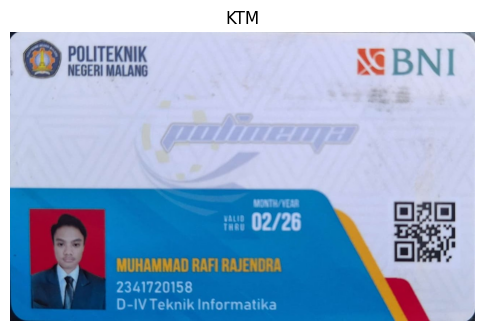

In [ ]:
# === Tampilkan KTM ===
import cv2, numpy as np, matplotlib.pyplot as plt
KTM_PATH = "/content/drive/MyDrive/PCVK/ktmku.jpg"

ktm = cv2.imread(KTM_PATH)
assert ktm is not None, "File KTM tidak ditemukan."
plt.figure(figsize=(6,4))
plt.imshow(cv2.cvtColor(ktm, cv2.COLOR_BGR2RGB))
plt.title("KTM"); plt.axis("off"); plt.show()

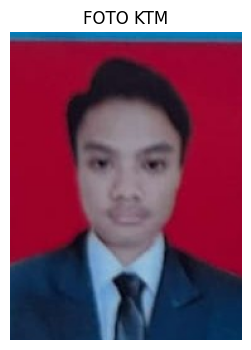

In [ ]:
# === Ekstrak & tampilkan FOTO KTM berbasis deteksi wajah ===
import cv2, numpy as np, matplotlib.pyplot as plt

def crop_portrait_around_face(img_bgr, aspect_w=3, aspect_h=4):
    """Crop otomatis foto portrait di sekitar wajah terbesar (fallback ke panel merah)."""
    H, W = img_bgr.shape[:2]

    # 1) Deteksi wajah
    gray = cv2.equalizeHist(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY))
    face_casc = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
    faces = face_casc.detectMultiScale(gray, scaleFactor=1.05, minNeighbors=5, minSize=(60,60))

    if len(faces) > 0:
        # ambil wajah terbesar
        x,y,w,h = max(faces, key=lambda b:b[2]*b[3])

        # 2) Perbesar bbox agar mencakup kepala + bahu
        #    (nilai faktor bisa disetel sesuai kebutuhan)
        expand_w = int(w * 1.6)
        expand_h = int(h * 2.1)
        cx = x + w//2
        cy = y + int(h * 0.55)  # sedikit turun agar dagu ikut

        # 3) Sesuaikan ke rasio 3:4
        target_w = expand_w
        target_h = int(target_w * aspect_h / aspect_w)
        if target_h < expand_h:
            target_h = expand_h
            target_w = int(target_h * aspect_w / aspect_h)

        # 4) Hitung kotak dan clamp ke batas gambar
        x0 = np.clip(cx - target_w//2, 0, W-1)
        y0 = np.clip(cy - target_h//2, 0, H-1)
        x1 = np.clip(x0 + target_w, 0, W)
        y1 = np.clip(y0 + target_h, 0, H)
        crop = img_bgr[int(y0):int(y1), int(x0):int(x1)]
        return crop

    # --- Fallback: cari panel merah (kalau wajah gagal terdeteksi)
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    m1 = cv2.inRange(hsv, (0,70,60), (10,255,255))
    m2 = cv2.inRange(hsv, (170,70,60), (180,255,255))
    mask = cv2.morphologyEx(m1 | m2, cv2.MORPH_CLOSE, np.ones((7,7),np.uint8), 2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  np.ones((5,5),np.uint8), 1)
    cnts,_ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if cnts:
        x,y,w,h = max((cv2.boundingRect(c) for c in cnts), key=lambda b:b[2]*b[3])
        p = int(0.03*max(w,h))
        x0=max(0,x-p); y0=max(0,y-p); x1=min(W, x+w+p); y1=min(H, y+h+p)
        return img_bgr[y0:y1, x0:x1]

    return None

foto = crop_portrait_around_face(ktm)
assert foto is not None, "Foto KTM gagal diekstrak otomatis."
plt.figure(figsize=(4,4))
plt.imshow(cv2.cvtColor(foto, cv2.COLOR_BGR2RGB))
plt.title("FOTO KTM"); plt.axis("off"); plt.show()

KP: ref=2103 scene=6000 | good=501
Inliers RANSAC: 403


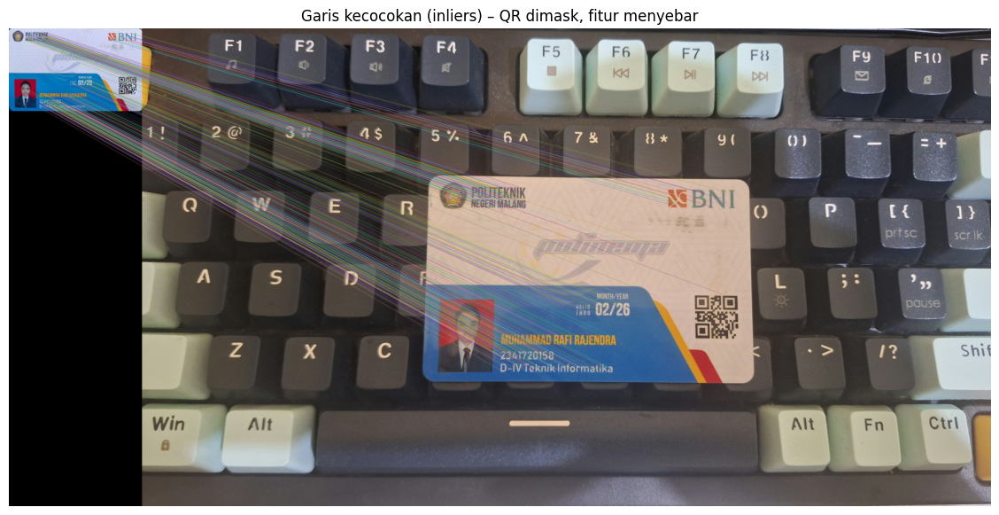

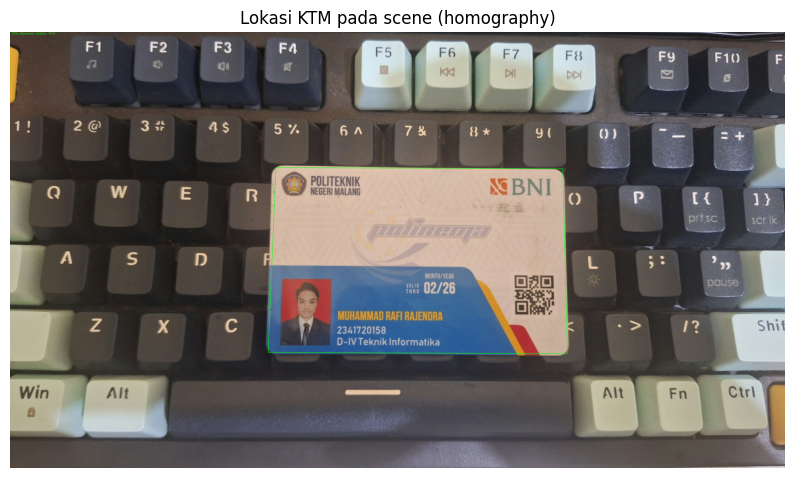

In [ ]:
# === Matching KTM ↔ KTM di scene, dengan masking QR & SIFT/AKAZE ===
import cv2, numpy as np, matplotlib.pyplot as plt

REF_PATH   = "/content/drive/MyDrive/PCVK/ktmku.jpg"
SCENE_PATH = "/content/drive/MyDrive/PCVK/ktm_barang.jpg"

ref   = cv2.imread(REF_PATH);   assert ref   is not None, "ktmku.jpg tidak ditemukan"
scene = cv2.imread(SCENE_PATH); assert scene is not None, "ktm_barang.jpg tidak ditemukan"

# --- detektor/deskriptor: SIFT -> fallback AKAZE ---
try:
    sift = cv2.SIFT_create(nfeatures=6000, contrastThreshold=0.03, edgeThreshold=15)
    detector = sift; norm = cv2.NORM_L2
except Exception:
    akaze = cv2.AKAZE_create()   # cukup kuat & bebas lisensi
    detector = akaze; norm = cv2.NORM_HAMMING

# --- fungsi: deteksi QR dan kembalikan mask (0 = diabaikan) ---
def qr_mask(img_bgr):
    H, W = img_bgr.shape[:2]
    mask = np.ones((H, W), np.uint8) * 255
    qrd = cv2.QRCodeDetector()
    retval, points = qrd.detect(img_bgr)
    if retval and points is not None:
        pts = points.reshape(-1, 2).astype(np.int32)
        cv2.fillConvexPoly(mask, pts, 0)  # nolkan area QR
    return mask

# --- praproses + masking QR ---
def preprocess(img):
    g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    g = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(g)
    return g

ref_g   = preprocess(ref)
scene_g = preprocess(scene)

mask_ref   = qr_mask(ref)
mask_scene = qr_mask(scene)

# --- ekstraksi fitur dengan mask (menghindari QR) ---
kps_ref,   des_ref   = detector.detectAndCompute(ref_g,   mask_ref)
kps_scene, des_scene = detector.detectAndCompute(scene_g, mask_scene)

# jika masih sedikit keypoint (mis. QR tidak terdeteksi), fallback tanpa mask
if des_ref is None or len(kps_ref) < 8:   kps_ref,   des_ref   = detector.detectAndCompute(ref_g,   None)
if des_scene is None or len(kps_scene) < 8: kps_scene, des_scene = detector.detectAndCompute(scene_g, None)

# --- KNN matching + Lowe ratio ---
bf  = cv2.BFMatcher(norm, crossCheck=False)
knn = bf.knnMatch(des_ref, des_scene, k=2)
good = [m for m,n in knn if m.distance < 0.75*n.distance]

print(f"KP: ref={len(kps_ref)} scene={len(kps_scene)} | good={len(good)}")

if len(good) < 12:
    print("Good matches masih sedikit; coba naikkan resolusi foto atau longgarkan ratio (0.8).")
    vis = cv2.drawMatches(ref, kps_ref, scene, kps_scene, good, None,
                          flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(16,7)); plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title(f"Good matches: {len(good)}"); plt.axis("off"); plt.show()
else:
    src = np.float32([kps_ref[m.queryIdx].pt  for m in good]).reshape(-1,1,2)
    dst = np.float32([kps_scene[m.trainIdx].pt for m in good]).reshape(-1,1,2)
    H, mask = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)

    inliers = [m for m,keep in zip(good, mask.ravel().tolist()) if keep==1]
    print(f"Inliers RANSAC: {len(inliers)}")

    # Gambar garis (hanya inliers)
    vis_inliers = cv2.drawMatches(ref, kps_ref, scene, kps_scene, inliers, None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Poligon lokasi KTM pada scene
    vis_scene = scene.copy()
    if H is not None:
        h, w = ref.shape[:2]
        corners = np.float32([[0,0],[w,0],[w,h],[0,h]]).reshape(-1,1,2)
        proj = cv2.perspectiveTransform(corners, H)
        cv2.polylines(vis_scene, [np.int32(proj)], True, (0,255,0), 4)
        cv2.putText(vis_scene, f"KTM ditemukan (inliers: {len(inliers)})",
                    (20,35), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)

    # tampilkan
    plt.figure(figsize=(16,7))
    plt.imshow(cv2.cvtColor(vis_inliers, cv2.COLOR_BGR2RGB))
    plt.title("Garis kecocokan (inliers) – QR dimask, fitur menyebar")
    plt.axis("off"); plt.show()

    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(vis_scene, cv2.COLOR_BGR2RGB))
    plt.title("Lokasi KTM pada scene (homography)")
    plt.axis("off"); plt.show()

## Tambahan Tugas Praktikum:

In [11]:
!pip install tensorflow

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings('ignore')

print(f"TensorFlow Version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")

TensorFlow Version: 2.19.0
GPU Available: []


In [14]:
# Paths
TRAIN_PATH = '/content/drive/MyDrive/PCVK/ANGKA/'
KTM_PATH = '/content/drive/MyDrive/PCVK/ktmku.jpg'
MODEL_PATH = 'digits.keras'  # Changed from .h5 to .keras
LOG_DIR = 'logs'

# Hyperparameters
IMG_SIZE = (64, 64)
BATCH_SIZE = 32
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = 10
VALIDATION_SPLIT = 0.2

# Create directories
os.makedirs(LOG_DIR, exist_ok=True)

print("Configuration loaded successfully!")
print(f"Image Size: {IMG_SIZE}")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")
print(f"Number of Classes: {NUM_CLASSES}")
print(f"Model will be saved as: {MODEL_PATH}")

Configuration loaded successfully!
Image Size: (64, 64)
Batch Size: 32
Epochs: 50
Number of Classes: 10
Model will be saved as: digits.keras


In [15]:
def load_dataset(data_path):
    """
    Load images and labels from directory
    Format file: angka_{digit}_aug_{number}.jpg atau angka_{digit}.jpg
    """
    images = []
    labels = []
    file_info = []

    print("Loading dataset...")
    print(f"Scanning directory: {data_path}\n")

    # Get all image files
    all_files = [f for f in os.listdir(data_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    print(f"Total files found: {len(all_files)}\n")

    # Parse filenames
    for img_file in all_files:
        try:
            # Format: angka_0_aug_00000.jpg atau angka_0.jpg
            # Remove extension first
            filename_no_ext = os.path.splitext(img_file)[0]
            filename_parts = filename_no_ext.split('_')

            # Extract digit from filename (angka_X_... atau angka_X)
            if len(filename_parts) >= 2 and filename_parts[0] == 'angka':
                digit = int(filename_parts[1])

                # Validate digit range
                if digit < 0 or digit >= NUM_CLASSES:
                    print(f"Warning: Invalid digit {digit} in {img_file}")
                    continue

                # Read image
                img_path = os.path.join(data_path, img_file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

                if img is not None:
                    img_resized = cv2.resize(img, IMG_SIZE)
                    images.append(img_resized)
                    labels.append(digit)
                    file_info.append({
                        'filename': img_file,
                        'digit': digit,
                        'is_augmented': 'aug' in img_file
                    })
                else:
                    print(f"Warning: Cannot read {img_file}")
            else:
                print(f"Warning: Skipping {img_file} (invalid format)")

        except (ValueError, IndexError) as e:
            print(f"Warning: Cannot parse {img_file} - {e}")
            continue

    images = np.array(images)
    labels = np.array(labels)

    # Summary statistics
    print("\n" + "="*70)
    print("DATASET LOADING SUMMARY")
    print("="*70)
    print(f"Total images loaded: {len(images)}")
    print(f"Images shape: {images.shape}")
    print(f"Labels shape: {labels.shape}")

    # Count original vs augmented
    df_info = pd.DataFrame(file_info)
    if len(df_info) > 0:
        original_count = (~df_info['is_augmented']).sum()
        augmented_count = df_info['is_augmented'].sum()
        print(f"\nOriginal images: {original_count}")
        print(f"Augmented images: {augmented_count}")

    return images, labels, file_info

# Load data
X, y, file_info_list = load_dataset(TRAIN_PATH)

# Check class distribution
unique, counts = np.unique(y, return_counts=True)
print("\n" + "="*70)
print("CLASS DISTRIBUTION")
print("="*70)
for digit, count in zip(unique, counts):
    print(f"Digit {digit}: {count:4d} samples")

# Additional statistics per digit
if len(file_info_list) > 0:
    df_info = pd.DataFrame(file_info_list)
    print("\n" + "="*70)
    print("DETAILED DISTRIBUTION (Original vs Augmented)")
    print("="*70)
    for digit in sorted(df_info['digit'].unique()):
        digit_data = df_info[df_info['digit'] == digit]
        original = (~digit_data['is_augmented']).sum()
        augmented = digit_data['is_augmented'].sum()
        total = len(digit_data)
        print(f"Digit {digit}: Total={total:4d} | Original={original:4d} | Augmented={augmented:4d}")

Streaming output truncated to the last 5000 lines.

DATASET LOADING SUMMARY
Total images loaded: 3500
Images shape: (3500, 64, 64)
Labels shape: (3500,)

Original images: 0
Augmented images: 3500

CLASS DISTRIBUTION
Digit 0:  350 samples
Digit 1:  350 samples
Digit 2:  350 samples
Digit 3:  350 samples
Digit 4:  350 samples
Digit 5:  350 samples
Digit 6:  350 samples
Digit 7:  350 samples
Digit 8:  350 samples
Digit 9:  350 samples

DETAILED DISTRIBUTION (Original vs Augmented)
Digit 0: Total= 350 | Original=   0 | Augmented= 350
Digit 1: Total= 350 | Original=   0 | Augmented= 350
Digit 2: Total= 350 | Original=   0 | Augmented= 350
Digit 3: Total= 350 | Original=   0 | Augmented= 350
Digit 4: Total= 350 | Original=   0 | Augmented= 350
Digit 5: Total= 350 | Original=   0 | Augmented= 350
Digit 6: Total= 350 | Original=   0 | Augmented= 350
Digit 7: Total= 350 | Original=   0 | Augmented= 350
Digit 8: Total= 350 | Original=   0 | Augmented= 350
Digit 9: Total= 350 | Original=   0 | Au

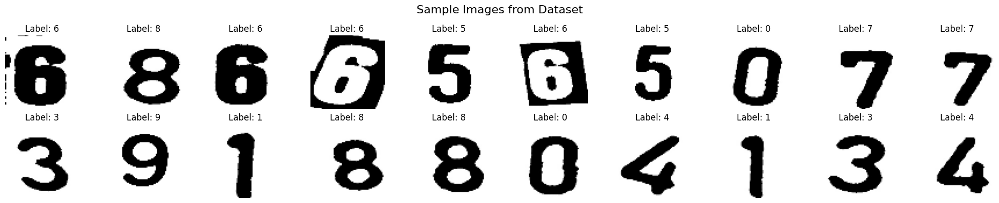

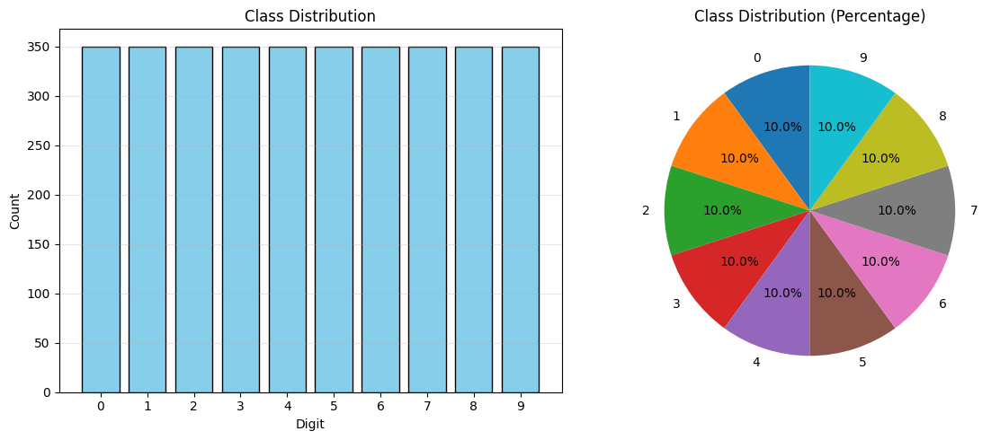

In [16]:
def plot_sample_images(images, labels, num_samples=20):
    """Plot sample images from dataset"""
    fig, axes = plt.subplots(2, 10, figsize=(20, 4))
    fig.suptitle('Sample Images from Dataset', fontsize=16)

    indices = np.random.choice(len(images), num_samples, replace=False)

    for i, idx in enumerate(indices):
        ax = axes[i // 10, i % 10]
        ax.imshow(images[idx], cmap='gray')
        ax.set_title(f'Label: {labels[idx]}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize samples
plot_sample_images(X, y)

# Plot class distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
unique, counts = np.unique(y, return_counts=True)
plt.bar(unique, counts, color='skyblue', edgecolor='black')
plt.xlabel('Digit')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(unique)
plt.grid(axis='y', alpha=0.3)

plt.subplot(1, 2, 2)
plt.pie(counts, labels=unique, autopct='%1.1f%%', startangle=90)
plt.title('Class Distribution (Percentage)')

plt.tight_layout()
plt.show()

In [17]:
# Normalize pixel values to [0, 1]
X = X.astype('float32') / 255.0

# Reshape for CNN (add channel dimension)
X = X.reshape(-1, IMG_SIZE[0], IMG_SIZE[1], 1)

# One-hot encode labels
y_categorical = to_categorical(y, NUM_CLASSES)

# Split data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    X, y_categorical,
    test_size=VALIDATION_SPLIT,
    random_state=42,
    stratify=y
)

print("Data Preprocessing Complete!")
print(f"Training set shape: {X_train.shape}")
print(f"Validation set shape: {X_val.shape}")
print(f"Training labels shape: {y_train.shape}")
print(f"Validation labels shape: {y_val.shape}")

Data Preprocessing Complete!
Training set shape: (2800, 64, 64, 1)
Validation set shape: (700, 64, 64, 1)
Training labels shape: (2800, 10)
Validation labels shape: (700, 10)


Data Augmentation configured!
Training batches: 88
Validation batches: 22


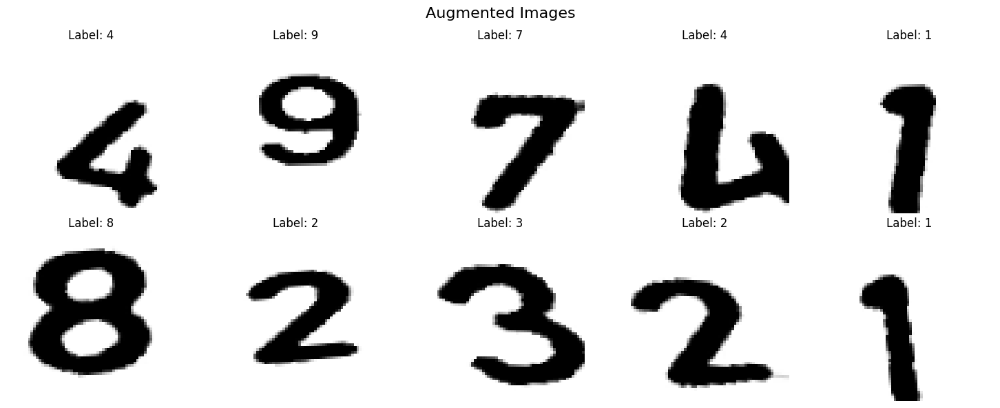

In [18]:
# Create data augmentation generator
train_datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    shear_range=0.1,
    fill_mode='nearest'
)

# Validation data (no augmentation)
val_datagen = ImageDataGenerator()

# Create generators
train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
val_generator = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE)

print("Data Augmentation configured!")
print(f"Training batches: {len(train_generator)}")
print(f"Validation batches: {len(val_generator)}")

# Visualize augmented images
def show_augmented_images(generator, num_samples=10):
    """Show augmented images"""
    X_batch, y_batch = next(generator)

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle('Augmented Images', fontsize=16)

    for i in range(num_samples):
        ax = axes[i // 5, i % 5]
        ax.imshow(X_batch[i].reshape(IMG_SIZE), cmap='gray')
        ax.set_title(f'Label: {np.argmax(y_batch[i])}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_augmented_images(train_generator)

In [19]:
def build_cnn_model(input_shape, num_classes):
    """Build CNN model for digit recognition"""
    model = models.Sequential([
        # First Convolutional Block
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Second Convolutional Block
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Third Convolutional Block
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Flatten and Dense Layers
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])

    return model

# Build model
input_shape = (IMG_SIZE[0], IMG_SIZE[1], 1)
model = build_cnn_model(input_shape, NUM_CLASSES)

# Compile model
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 64, 64, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,421,354 (9.24 MB)

 Trainable params: 2,419,690 (9.23 MB)

 Non-trainable params: 1,664 (6.50 KB)

In [20]:
# Model checkpoint to save best model
checkpoint = ModelCheckpoint(
    MODEL_PATH,
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate on plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-7,
    verbose=1
)

# TensorBoard for visualization
tensorboard = TensorBoard(
    log_dir=LOG_DIR,
    histogram_freq=1
)

callbacks = [checkpoint, early_stopping, reduce_lr, tensorboard]

print("Callbacks configured successfully!")

Callbacks configured successfully!


Starting training...
Epoch 1/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4909 - loss: 1.7877
Epoch 1: val_accuracy improved from -inf to 0.10000, saving model to digits.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 132s 1s/step - accuracy: 0.4930 - loss: 1.7796 - val_accuracy: 0.1000 - val_loss: 7.4870 - learning_rate: 0.0010
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9031 - loss: 0.3508
Epoch 2: val_accuracy did not improve from 0.10000
88/88 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - accuracy: 0.9032 - loss: 0.3504 - val_accuracy: 0.1000 - val_loss: 9.9579 - learning_rate: 0.0010
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9538 - loss: 0.1797
Epoch 3: val_accuracy did not improve from 0.10000

Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
88/88 ━━━━━━━━━━━━━━━━━━━━ 115s 1s/step - accuracy: 0.9538 - loss: 0.1797 - val_accuracy: 0.1000 - val_loss: 11.6346 - learning_rate: 0.0010
Epoch 4/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step

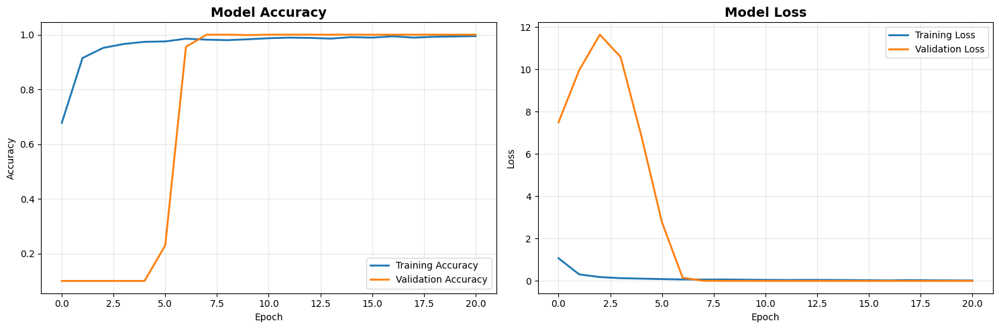


Final Training Metrics:
Training Accuracy: 0.9950
Validation Accuracy: 1.0000
Training Loss: 0.0203
Validation Loss: 0.0003


In [21]:
print("Starting training...")
print("=" * 70)

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=callbacks,
    verbose=1
)

print("\nTraining completed!")

def plot_training_history(history):
    """Plot training and validation metrics"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Accuracy plot
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Loss plot
    axes[1].plot(history.history['loss'], label='Training Loss', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print final metrics
    print("\nFinal Training Metrics:")
    print(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}")
    print(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
    print(f"Training Loss: {history.history['loss'][-1]:.4f}")
    print(f"Validation Loss: {history.history['val_loss'][-1]:.4f}")

plot_training_history(history)

In [22]:
print("Evaluating model on validation set...")

# Load best model (now .keras format)
best_model = keras.models.load_model(MODEL_PATH)

# Evaluate
val_loss, val_accuracy = best_model.evaluate(X_val, y_val, verbose=0)
print(f"\nBest Model - Validation Accuracy: {val_accuracy:.4f}")
print(f"Best Model - Validation Loss: {val_loss:.4f}")

# Predictions
y_pred = best_model.predict(X_val, verbose=0)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_val, axis=1)

# Classification Report
print("\nClassification Report:")
print("=" * 70)
print(classification_report(y_true, y_pred_classes, target_names=[str(i) for i in range(NUM_CLASSES)]))

Evaluating model on validation set...

Best Model - Validation Accuracy: 1.0000
Best Model - Validation Loss: 0.0077

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        70
           1       1.00      1.00      1.00        70
           2       1.00      1.00      1.00        70
           3       1.00      1.00      1.00        70
           4       1.00      1.00      1.00        70
           5       1.00      1.00      1.00        70
           6       1.00      1.00      1.00        70
           7       1.00      1.00      1.00        70
           8       1.00      1.00      1.00        70
           9       1.00      1.00      1.00        70

    accuracy                           1.00       700
   macro avg       1.00      1.00      1.00       700
weighted avg       1.00      1.00      1.00       700



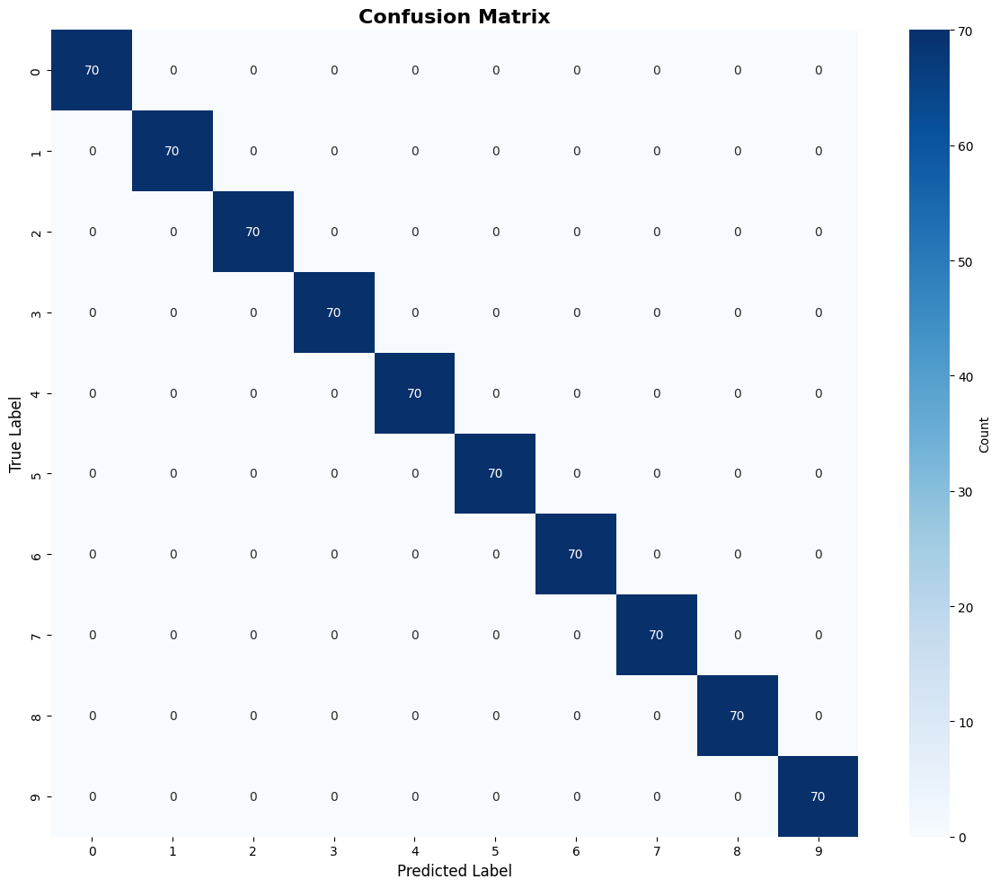


Per-Class Accuracy:
Digit 0: 1.0000 (70/70)
Digit 1: 1.0000 (70/70)
Digit 2: 1.0000 (70/70)
Digit 3: 1.0000 (70/70)
Digit 4: 1.0000 (70/70)
Digit 5: 1.0000 (70/70)
Digit 6: 1.0000 (70/70)
Digit 7: 1.0000 (70/70)
Digit 8: 1.0000 (70/70)
Digit 9: 1.0000 (70/70)


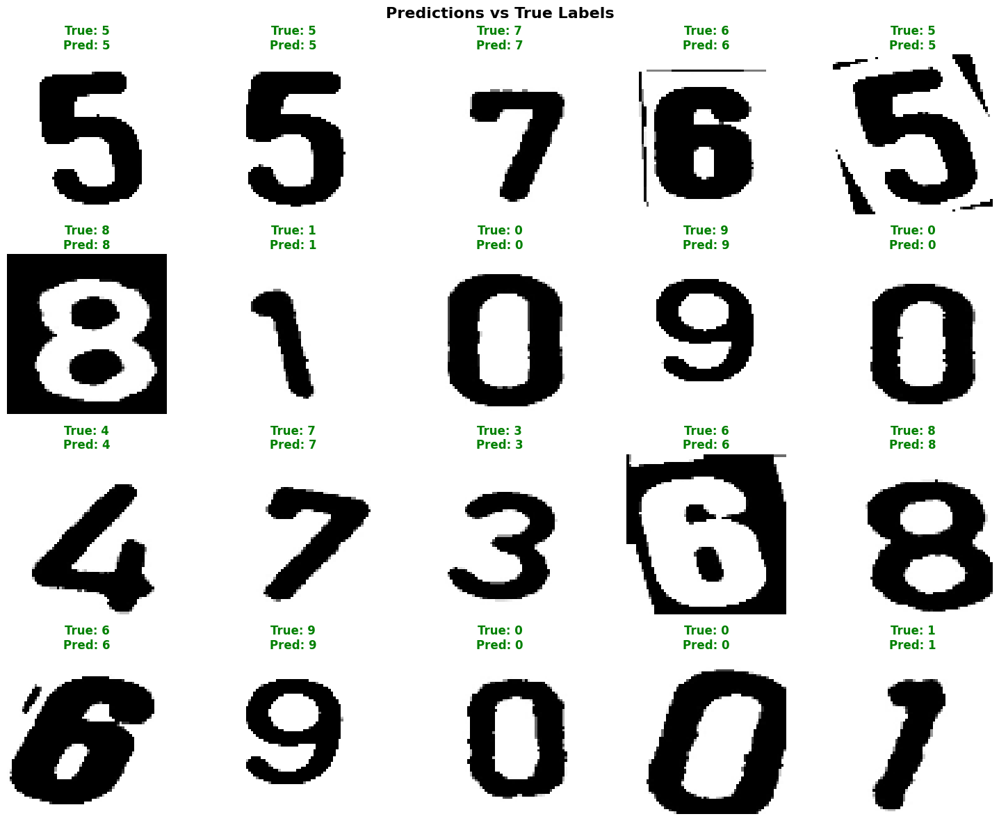

In [23]:
# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=range(NUM_CLASSES),
            yticklabels=range(NUM_CLASSES),
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.show()

# Calculate per-class accuracy
print("\nPer-Class Accuracy:")
print("=" * 50)
for i in range(NUM_CLASSES):
    class_accuracy = cm[i, i] / cm[i].sum() if cm[i].sum() > 0 else 0
    print(f"Digit {i}: {class_accuracy:.4f} ({cm[i, i]}/{cm[i].sum()})")

def plot_predictions(images, true_labels, pred_labels, num_samples=20):
    """Plot predictions with true labels"""
    fig, axes = plt.subplots(4, 5, figsize=(15, 12))
    fig.suptitle('Predictions vs True Labels', fontsize=16, fontweight='bold')

    indices = np.random.choice(len(images), num_samples, replace=False)

    for i, idx in enumerate(indices):
        ax = axes[i // 5, i % 5]
        ax.imshow(images[idx].reshape(IMG_SIZE), cmap='gray')

        true_label = true_labels[idx]
        pred_label = pred_labels[idx]

        color = 'green' if true_label == pred_label else 'red'
        ax.set_title(f'True: {true_label}\nPred: {pred_label}', color=color, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Show predictions
plot_predictions(X_val, y_true, y_pred_classes)

# Show misclassified examples
misclassified_indices = np.where(y_true != y_pred_classes)[0]
if len(misclassified_indices) > 0:
    print(f"\nTotal Misclassified: {len(misclassified_indices)}")
    print("Showing misclassified examples...")

    num_show = min(20, len(misclassified_indices))
    selected_indices = misclassified_indices[:num_show]

    plot_predictions(X_val[selected_indices],
                    y_true[selected_indices],
                    y_pred_classes[selected_indices],
                    num_samples=num_show)

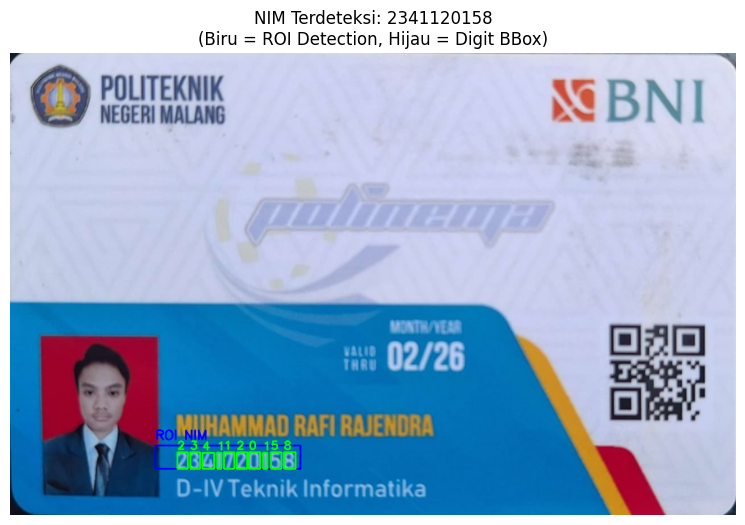

NIM: 2341120158


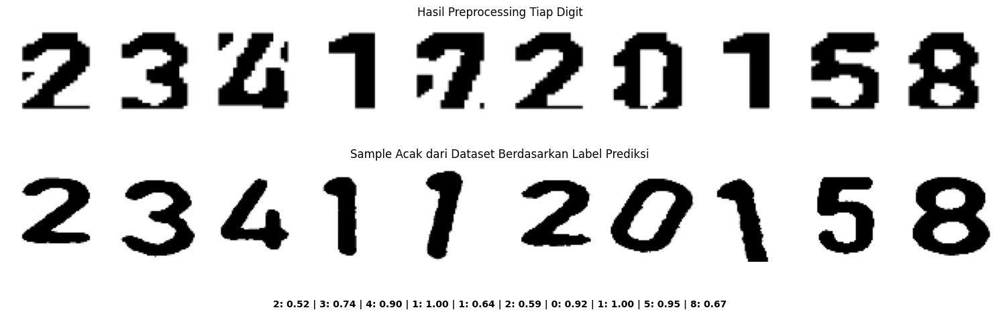

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras

# ============================================================================
# PREPROCESSING - TETAP SEDERHANA
# ============================================================================
def preprocess_digit_simple(digit_roi, img_size=(64, 64)):
    # --- Langkah 1: Normalisasi awal ---
    if len(digit_roi.shape) == 3:
        digit_roi = cv2.cvtColor(digit_roi, cv2.COLOR_BGR2GRAY)

    # --- Langkah 2: Gaussian blur untuk mengurangi noise ---
    blurred = cv2.GaussianBlur(digit_roi, (3, 3), 0)

    # --- Langkah 3: Threshold adaptif (lebih baik dari OTSU untuk kontras rendah) ---
    binary = cv2.adaptiveThreshold(
        blurred, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        11, 2
    )

    # --- Langkah 4: Pastikan background = putih, foreground = hitam ---
    border_pixels = np.concatenate([
        binary[0, :], binary[-1, :], binary[:, 0], binary[:, -1]
    ])

    if np.mean(border_pixels == 0) > 0.5:
        binary = cv2.bitwise_not(binary)

    # --- Langkah 5: Morphological cleaning untuk hapus noise kecil ---
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)

    # --- Langkah 6: Crop ketat berdasarkan foreground ---
    coords = cv2.findNonZero(255 - binary)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        binary = binary[y:y+h, x:x+w]

    # --- Langkah 7: Padding sedikit sebelum resize ---
    pad = 4
    binary = cv2.copyMakeBorder(binary, pad, pad, pad, pad,
                                cv2.BORDER_CONSTANT, value=255)

    # --- Langkah 8: Resize ke ukuran target ---
    binary = cv2.resize(binary, img_size, interpolation=cv2.INTER_AREA)

    return binary

# ============================================================================
# DETEKSI NIM - DENGAN PERBAIKAN
# ============================================================================
def detect_nim_only(image_path, model, img_size=(28, 28), debug=False):
    img = cv2.imread(image_path)
    if img is None:
        print("Gagal membaca gambar.")
        return None, None, None

    img = cv2.resize(img, (1186, 755), interpolation=cv2.INTER_AREA)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape

    # ROI NIM
    roi_y1 = int(h * 0.85)
    roi_y2 = int(h * 0.90)
    roi_x1 = int(w * 0.20)  # Diubah dari 0.24 ke 0.15
    roi_x2 = int(w * 0.40)  # Diubah dari 0.45 ke 0.40
    roi = gray[roi_y1:roi_y2, roi_x1:roi_x2]

    # Simpan koordinat ROI untuk visualisasi
    roi_coords = (roi_x1, roi_y1, roi_x2, roi_y2)

    # Preprocessing ROI
    blur = cv2.GaussianBlur(roi, (3, 3), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((2, 2), np.uint8)
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

    contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    results = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)

        # Filter ukuran
        if h < 15 or w < 5:
            continue

        # Tight cropping untuk angka 1
        if h / w > 2.5:
            margin = int(w * 0.18)
            x += margin
            w -= 2 * margin
            if w < 4:
                w = 4

        # Extract digit
        digit = roi[y:y+h, x:x+w]
        processed = preprocess_digit_simple(digit, img_size)
        processed_norm = processed.astype('float32') / 255.0
        input_model = processed_norm.reshape(1, *img_size, 1)

        pred = model.predict(input_model, verbose=0)
        digit_pred = np.argmax(pred)
        confidence = pred[0][digit_pred]

        # Logika sederhana: 1 vs 7
        if digit_pred == 7 and h / w > 2.5:
            digit_pred = 1
            confidence = pred[0][1]

        results.append({
            'digit': digit_pred,
            'confidence': confidence,
            'bbox': (x + roi_x1, y + roi_y1, w, h)
        })

    # Urutkan dari kiri ke kanan
    results = sorted(results, key=lambda r: r['bbox'][0])

    if debug:
        plt.imshow(morph, cmap='gray')
        plt.title("Debug: ROI Setelah Preprocessing")
        plt.axis('off')
        plt.show()

    return img, results, roi_coords

# ============================================================================
# VISUALISASI HASIL KOMPARASI
# ============================================================================
def visualize_nim_results(img, results, roi_coords=None):
    if not results:
        print("Tidak ada digit yang terdeteksi.")
        return

    canvas = img.copy()
    number = ''.join([str(r['digit']) for r in results])

    # Gambar ROI box (biru) jika ada
    if roi_coords is not None:
        roi_x1, roi_y1, roi_x2, roi_y2 = roi_coords
        cv2.rectangle(canvas, (roi_x1, roi_y1), (roi_x2, roi_y2), (255, 0, 0), 2)
        cv2.putText(canvas, "ROI NIM", (roi_x1, roi_y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

    # Gambar bbox digit (hijau)
    for r in results:
        x, y, w, h = r['bbox']
        cv2.rectangle(canvas, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(canvas, str(r['digit']), (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    plt.figure(figsize=(12, 6))
    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.title(f"NIM Terdeteksi: {number}\n(Biru = ROI Detection, Hijau = Digit BBox)", fontsize=12)
    plt.axis('off')
    plt.show()

    print("NIM:", number)

def visualize_digit_comparison(image_path, results, model, train_dir, img_size=(28, 28)):
    """
    Bandingkan hasil preprocess digit dengan sample acak dari dataset
    (file dataset: angka_{digit}_aug_{nomor}.jpg di folder flat)
    """
    import cv2, os, random
    import numpy as np
    import matplotlib.pyplot as plt

    if not results:
        print("Tidak ada digit yang terdeteksi.")
        return

    # Baca dan resize gambar dengan cara yang SAMA seperti di detect_nim_only
    img = cv2.imread(image_path)
    img = cv2.resize(img, (1186, 755), interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    processed_digits, sample_digits = [], []
    pred_labels, confidences = [], []

    for r in results:
        x, y, w, h = r['bbox']
        digit_roi = gray[y:y+h, x:x+w]

        # Preprocess seperti biasa
        processed = preprocess_digit_simple(digit_roi, img_size)
        processed_norm = processed.astype('float32') / 255.0
        input_model = processed_norm.reshape(1, *img_size, 1)

        pred = model.predict(input_model, verbose=0)
        digit_pred = np.argmax(pred)
        confidence = pred[0][digit_pred]

        processed_digits.append(processed)
        pred_labels.append(digit_pred)
        confidences.append(confidence)

        # ==========================================================
        # Cari sample acak di folder flat
        # ==========================================================
        candidates = [
            f for f in os.listdir(train_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            and f"angka_{digit_pred}_aug_" in f.lower()
        ]

        if candidates:
            chosen = random.choice(candidates)
            sample_path = os.path.join(train_dir, chosen)
            sample_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
            if sample_img is not None:
                sample_img = cv2.resize(sample_img, img_size)
                sample_digits.append(sample_img)
                continue

        # fallback kosong kalau tidak ketemu
        sample_digits.append(np.zeros(img_size, dtype=np.uint8))

    # ==========================================================
    # Visualisasi
    # ==========================================================
    fig, axes = plt.subplots(2, 1, figsize=(max(6, len(results) * 1.5), 5))

    combined_proc = np.hstack(processed_digits)
    axes[0].imshow(combined_proc, cmap='gray')
    axes[0].set_title("Hasil Preprocessing Tiap Digit", fontsize=12)
    axes[0].axis('off')

    combined_sample = np.hstack(sample_digits)
    axes[1].imshow(combined_sample, cmap='gray')
    axes[1].set_title("Sample Acak dari Dataset Berdasarkan Label Prediksi", fontsize=12)
    axes[1].axis('off')

    conf_text = " | ".join([f"{lbl}: {conf:.2f}" for lbl, conf in zip(pred_labels, confidences)])
    fig.text(0.5, 0.03, conf_text, ha='center', fontsize=10, color='black', weight='bold')

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()


# ============================================================================
# MAIN
# ============================================================================
MODEL_PATH = 'digits.keras'
IMAGE_PATH = '/content/drive/MyDrive/PCVK/ktmku.jpg'
TRAIN_DIR = '/content/drive/MyDrive/PCVK/ANGKA/'

model = keras.models.load_model(MODEL_PATH)
IMG_SIZE = (model.input_shape[1], model.input_shape[2])

img, results, roi_coords = detect_nim_only(IMAGE_PATH, model, img_size=IMG_SIZE, debug=False)
visualize_nim_results(img, results, roi_coords)
visualize_digit_comparison(IMAGE_PATH, results, model, TRAIN_DIR, img_size=IMG_SIZE)